In [6]:
import pandas as pd
from bifacial_peak_shaving import *
from utils import *
pd.options.plotting.backend='plotly'

# Data

In [7]:
dir = './Data/'

## Load

<class 'pandas.core.frame.DataFrame'>
DatetimeIndex: 8760 entries, 2017-01-01 00:00:00 to 2017-12-31 23:00:00
Freq: H
Data columns (total 1 columns):
 #   Column     Non-Null Count  Dtype  
---  ------     --------------  -----  
 0   Load (kW)  8760 non-null   float64
dtypes: float64(1)
memory usage: 136.9 KB
None
         Load (kW)
count  8760.000000
mean   1241.082798
std     224.898524
min     727.350000
25%    1024.350000
50%    1295.550000
75%    1429.354136
max    1702.203795


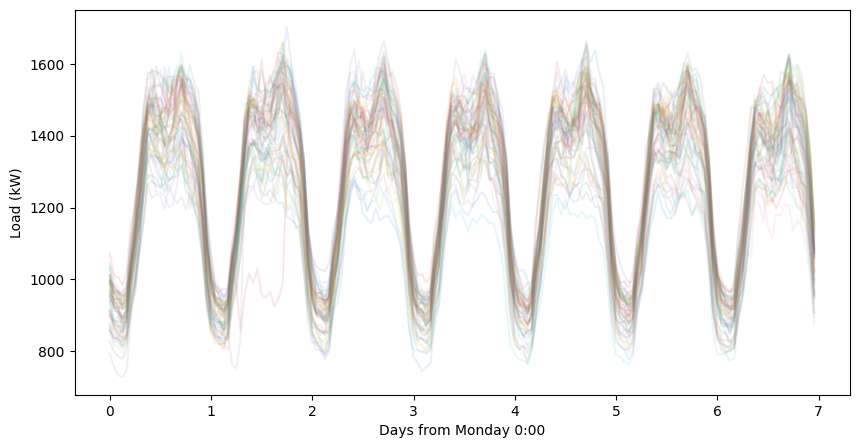

In [13]:
load = pd.read_csv(dir+'hotel1_load_IMFs.csv',
                   index_col=0,
                   parse_dates=True,
                   usecols=[0,1],
                   comment='#').loc['2017'].resample('1h').mean()
print(load.info())
print(load.describe())

plot_weekly(load['Load (kW)'],interval_min=60,alpha=0.1)

load.plot()

## Solar

- 7 kWp, TMY

- Net zero capacity

  - $capacity[kWp] = production[kWh] \times yield [\frac{kWh}{kWp}]^{-1}$

In [15]:
solar_angles = ['s20','w20','w90','s20w90']
solar = pd.concat(( 
                    pd.read_csv(dir+'Solar/Modelled/lemooreCA_7kwp_s20deg.csv',index_col=0),
                    pd.read_csv(dir+'Solar/Modelled/lemooreCA_7kwp_w20deg.csv',index_col=0),
                    pd.read_csv(dir+'Solar/Modelled/lemooreCA_7kwp_w90deg.csv',index_col=0),
                    pd.read_csv(dir+'Solar/Modelled/lemooreCA_3.5kwp_s20deg_3.5kwp_w90deg.csv',index_col=0),
                   ),
                  axis=1)
solar.index = pd.date_range('1900-1-1 0:00',periods=8760,freq='1h')
solar.columns = solar_angles
net_zero_capacity = load['Load (kW)'].sum() / (solar.s20.sum()/7) # load=production / yield
solar = solar * net_zero_capacity/7 # scale to net 0
#solar = solar * 2 # randomly scale up
solar.describe()

,s20,w20,w90,s20w90
count,8760.000000,8760.000000,8760.000000,8760.000000
mean,1241.082798,1109.448237,1186.940522,1215.019368
std,1752.266588,1565.872631,1560.332588,1547.396847
min,-4.317770,-4.317770,-3.935052,-3.611363
25%,-0.510767,-0.510767,-0.510767,-0.510767
50%,-0.510767,-0.510767,-0.510767,-0.510767
75%,2453.966700,2175.021954,2286.051043,2618.896948
max,7081.047450,6822.020761,5978.451390,5501.578852


In [16]:
# for col in solar:
#     plot_daily(solar[col],title=col,interval_min=60)

## Plot weekly

In [17]:
solar.index = load.index
df = pd.concat((load,solar),axis=1)
df.columns = ['load'] + ['solar_'+x for x in solar.columns]
for angle in solar.columns:
    df[f'netload_{angle}'] = df['load'] - solar[angle]
df    

,load,solar_s20,solar_w20,solar_w90,solar_s20w90,netload_s20,netload_w20,netload_w90,netload_s20w90
Datetime (UTC-10),,,,,,,,,
2017-01-01 00:00:00,958.20,-0.510767,-0.510767,-0.510767,-0.510767,958.710767,958.710767,958.710767,958.710767
2017-01-01 01:00:00,892.05,-0.510767,-0.510767,-0.510767,-0.510767,892.560767,892.560767,892.560767,892.560767
2017-01-01 02:00:00,870.60,-0.510767,-0.510767,-0.510767,-0.510767,871.110767,871.110767,871.110767,871.110767
2017-01-01 03:00:00,865.65,-0.510767,-0.510767,-0.510767,-0.510767,866.160767,866.160767,866.160767,866.160767
2017-01-01 04:00:00,854.70,-0.510767,-0.510767,-0.510767,-0.510767,855.210767,855.210767,855.210767,855.210767
...,...,...,...,...,...,...,...,...,...
2017-12-31 19:00:00,1296.60,-0.510767,-0.510767,-0.510767,-0.510767,1297.110767,1297.110767,1297.110767,1297.110767
2017-12-31 20:00:00,1261.80,-0.510767,-0.510767,-0.510767,-0.510767,1262.310767,1262.310767,1262.310767,1262.310767
2017-12-31 21:00:00,1199.55,-0.510767,-0.510767,-0.510767,-0.510767,1200.060767,1200.060767,1200.060767,1200.060767


load v s20

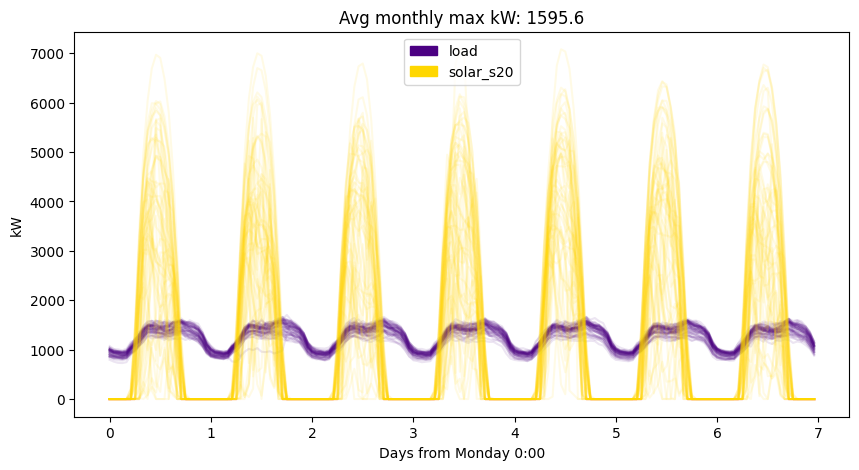

In [18]:
l = df['load']
s = df['solar_s20']
avg_monthly_max = (l - s).resample('1M').max().mean()  
plot_weekly((l,s),f'Avg monthly max kW: {avg_monthly_max:.1f}',ylabel='kW')

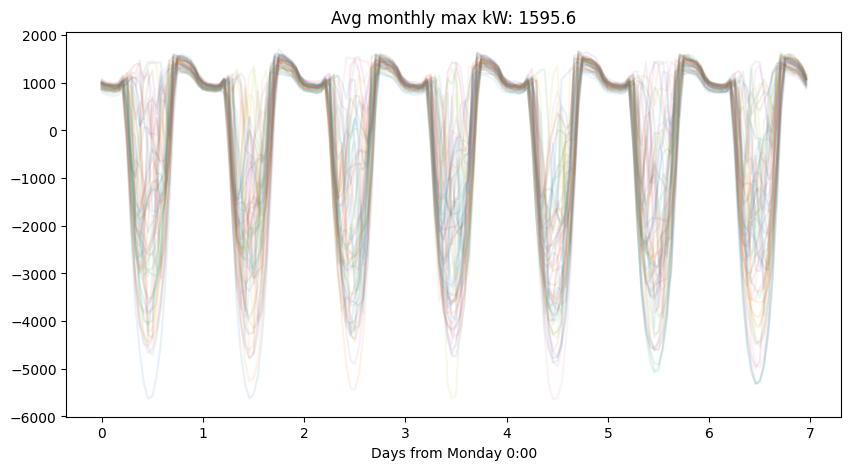

In [19]:
l = df['load']
s = df['solar_s20']
avg_monthly_max = (l - s).resample('1M').max().mean()  
plot_weekly(l-s,f'Avg monthly max kW: {avg_monthly_max:.1f}',ylabel='kW')

load v w20

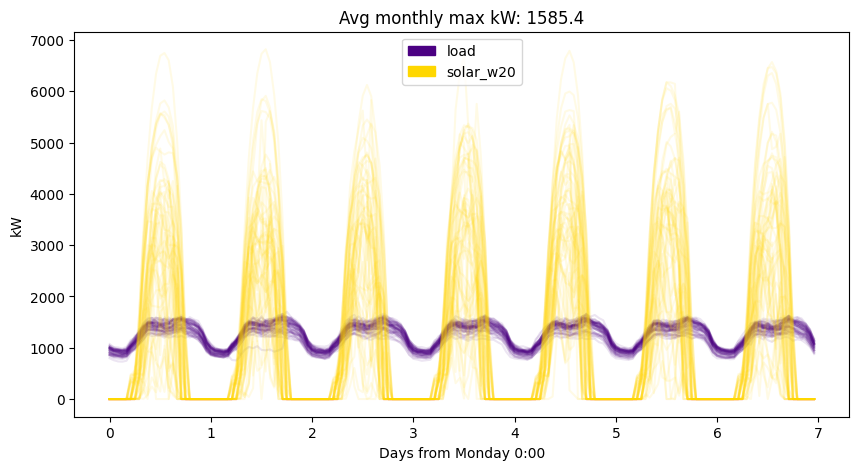

In [20]:
l = df['load']
s = df['solar_w20']
avg_monthly_max = (l - s).resample('1M').max().mean()  
plot_weekly((l,s),f'Avg monthly max kW: {avg_monthly_max:.1f}',ylabel='kW')

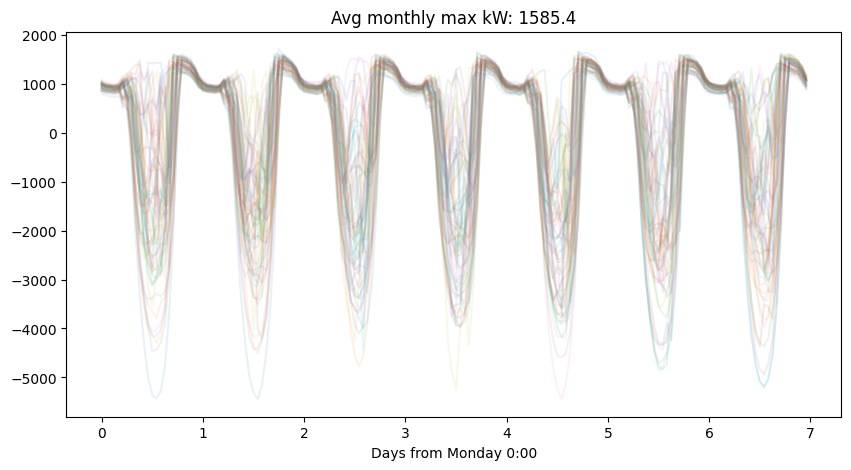

In [21]:
l = df['load']
s = df['solar_w20']
avg_monthly_max = (l - s).resample('1M').max().mean()  
plot_weekly(l-s,f'Avg monthly max kW: {avg_monthly_max:.1f}',ylabel='kW')

load v w90

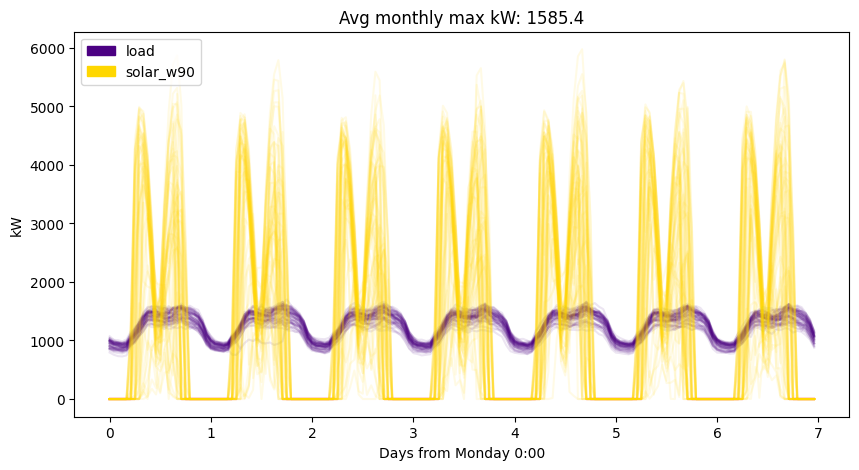

In [22]:
l = df['load']
s = df['solar_w90']
avg_monthly_max = (l - s).resample('1M').max().mean()  
plot_weekly((l,s),f'Avg monthly max kW: {avg_monthly_max:.1f}',ylabel='kW')

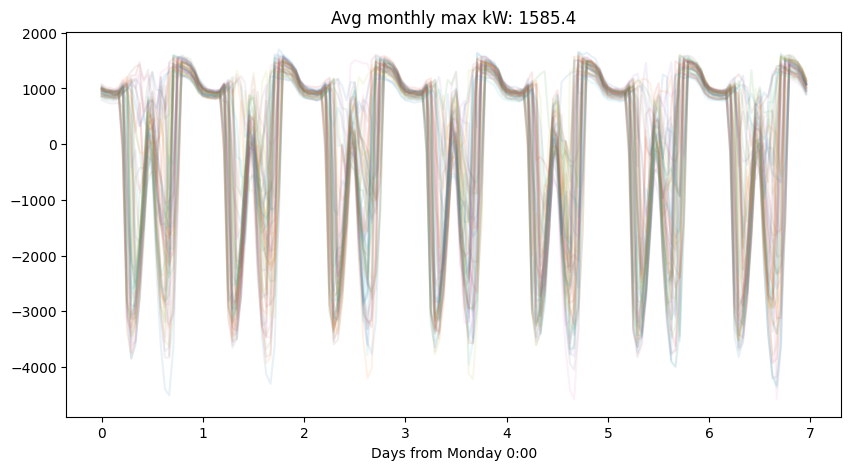

In [23]:
l = df['load']
s = df['solar_w90']
avg_monthly_max = (l - s).resample('1M').max().mean()  
plot_weekly(l-s,f'Avg monthly max kW: {avg_monthly_max:.1f}',ylabel='kW')

load v s20w90

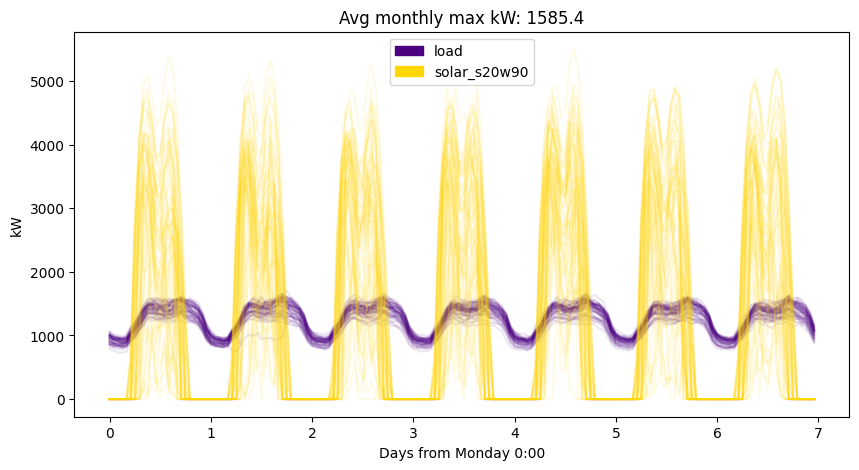

In [24]:
l = df['load']
s = df['solar_s20w90']
avg_monthly_max = (l - s).resample('1M').max().mean()  
plot_weekly((l,s),f'Avg monthly max kW: {avg_monthly_max:.1f}',ylabel='kW')

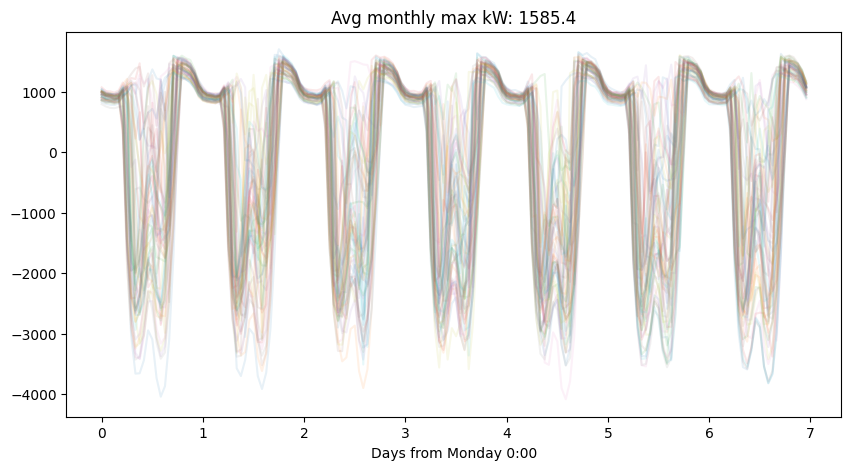

In [25]:
l = df['load']
s = df['solar_s20w90']
avg_monthly_max = (l - s).resample('1M').max().mean()  
plot_weekly(l-s,f'Avg monthly max kW: {avg_monthly_max:.1f}',ylabel='kW')

# Monthly peaks

## Single TOU

In [26]:
peak_begin,peak_end = 8,11
angle = 's20'
peaks = calc_monthly_peaks(df[f'netload_{angle}'],peak_begin,peak_end)

angle = 'w20'
peaks = pd.concat((peaks,calc_monthly_peaks(df[f'netload_{angle}'],peak_begin,peak_end)),axis=1)
peaks[f'netload_s20->{angle} reduc kw'] = peaks['netload_s20 kw'] - peaks[f'netload_{angle} kw']

angle = 'w90'
peaks = pd.concat((peaks,calc_monthly_peaks(df[f'netload_{angle}'],peak_begin,peak_end)),axis=1)
peaks[f'netload_s20->{angle} reduc kw'] = peaks['netload_s20 kw'] - peaks[f'netload_{angle} kw']

angle = 's20w90'
peaks = pd.concat((peaks,calc_monthly_peaks(df[f'netload_{angle}'],peak_begin,peak_end)),axis=1)
peaks[f'netload_s20->{angle} reduc kw'] = peaks['netload_s20 kw'] - peaks[f'netload_{angle} kw']

print('Avg w20 reduction',peaks['netload_s20->w20 reduc kw'].mean())
print('Avg w90 reduction',peaks['netload_s20->w90 reduc kw'].mean())
print('Avg s20w90 reduction',peaks['netload_s20->s20w90 reduc kw'].mean())
peaks

Avg w20 reduction 211.79166666666666
Avg w90 reduction 301.22499999999997
Avg s20w90 reduction 215.73333333333335


,netload_s20 kw,netload_s20 t,netload_w20 kw,netload_w20 t,netload_s20->w20 reduc kw,netload_w90 kw,netload_w90 t,netload_s20->w90 reduc kw,netload_s20w90 kw,netload_s20w90 t,netload_s20->s20w90 reduc kw
1,1289.0,2017-01-22 10:00:00,1289.0,2017-01-22 10:00:00,0.0,1326.9,2017-01-22 10:00:00,-37.9,1308.0,2017-01-22 10:00:00,-19.0
2,1396.2,2017-02-06 09:00:00,1396.2,2017-02-06 09:00:00,0.0,1425.5,2017-02-06 09:00:00,-29.3,1410.8,2017-02-06 09:00:00,-14.6
3,877.3,2017-03-09 08:00:00,879.3,2017-03-09 08:00:00,-2.0,979.5,2017-03-09 08:00:00,-102.2,928.3,2017-03-09 08:00:00,-51.0
4,1147.9,2017-04-13 08:00:00,1147.9,2017-04-13 08:00:00,0.0,1206.3,2017-04-13 08:00:00,-58.4,1177.1,2017-04-13 08:00:00,-29.2
5,917.6,2017-05-30 10:00:00,528.6,2017-05-17 08:00:00,389.0,654.8,2017-05-17 08:00:00,262.8,589.0,2017-05-17 08:00:00,328.6
6,-389.3,2017-06-14 10:00:00,-677.1,2017-06-14 10:00:00,287.8,-291.2,2017-06-28 10:00:00,-98.1,-500.6,2017-06-14 10:00:00,111.3
7,1532.5,2017-07-05 10:00:00,1282.9,2017-07-05 10:00:00,249.6,52.0,2017-07-23 09:00:00,1480.5,788.6,2017-07-05 10:00:00,743.9
8,1220.2,2017-08-24 10:00:00,633.5,2017-08-21 09:00:00,586.7,732.9,2017-08-21 09:00:00,487.3,660.4,2017-08-21 09:00:00,559.8
9,1343.2,2017-09-03 10:00:00,312.8,2017-09-03 10:00:00,1030.4,-437.1,2017-09-28 10:00:00,1780.3,349.1,2017-09-03 10:00:00,994.1
10,1469.2,2017-10-30 09:00:00,1469.2,2017-10-30 09:00:00,0.0,1469.2,2017-10-30 09:00:00,0.0,1469.2,2017-10-30 09:00:00,0.0


## Variable TOU

w20

In [27]:
angle1 = 's20'
angle2 = 'w20'

peak_reduc_v_TOU = net_load_peak_reduction_variable_TOU(df,angle1,angle2)
peak_reduc_v_TOU[peak_reduc_v_TOU['avg peak reduction [kW]']>0.2]

,TOU begin [h],TOU end [h],max peak reduction [kW],avg peak reduction [kW],min peak reduction [kW]
1,8,11,1030.4,211.8,-2.0
2,8,12,454.9,134.9,-2.0
3,8,13,389.0,65.8,-2.0
4,8,14,389.0,18.5,-205.3
8,8,18,200.0,24.6,0.0
9,8,19,497.2,51.8,0.0
10,8,20,56.8,10.2,0.0
11,8,21,56.8,10.2,0.0
12,9,11,1030.4,226.6,-45.2
13,9,12,585.6,147.7,-45.2


w90

In [28]:
angle1 = 's20'
angle2 = 'w90'

peak_reduc_v_TOU = net_load_peak_reduction_variable_TOU(df,angle1,angle2)
peak_reduc_v_TOU[peak_reduc_v_TOU['avg peak reduction [kW]']>0.2]

,TOU begin [h],TOU end [h],max peak reduction [kW],avg peak reduction [kW],min peak reduction [kW]
0,8,10,1038.5,138.0,-145.0
1,8,11,1780.3,301.2,-102.2
2,8,12,537.5,48.1,-563.9
3,8,13,483.1,43.8,-397.4
4,8,14,483.1,44.6,-397.4
...,...,...,...,...,...
72,17,19,621.3,62.7,0.0
73,17,20,56.8,10.2,0.0
74,17,21,56.8,10.2,0.0
75,18,20,41.7,5.5,0.0


s20w90

In [29]:
angle1 = 's20'
angle2 = 's20w90'

peak_reduc_v_TOU = net_load_peak_reduction_variable_TOU(df,angle1,angle2)
peak_reduc_v_TOU[peak_reduc_v_TOU['avg peak reduction [kW]']>0.2]

,TOU begin [h],TOU end [h],max peak reduction [kW],avg peak reduction [kW],min peak reduction [kW]
0,8,10,902.3,149.1,-72.5
1,8,11,994.1,215.7,-51.0
2,8,12,351.7,50.3,-218.9
3,8,13,328.6,60.4,-54.7
4,8,14,328.6,61.2,-54.7
...,...,...,...,...,...
72,17,19,525.8,53.5,0.0
73,17,20,56.8,10.2,0.0
74,17,21,56.8,10.2,0.0
75,18,20,41.7,5.5,0.0


Best for w90

In [30]:
#df.loc['2022-6-28':'2022-6-30'][['load','solar_s20','solar_w90','solar_s20w90']].plot()

In [31]:
#df.loc['2022-3-5':'2022-3-7'][['load','solar_s20','solar_w90','solar_s20w90']].plot()

Largest spread w90 v s20w90

In [32]:
#df.loc['2022-10-12':'2022-10-14'][['load','solar_s20','solar_w90','solar_s20w90']].plot()

# Peak shaving

## Technical

More or less technical peak shaving doesn't benefit from bifacial, I think because if you're trying to shave the entire day you benefit more from the greater kWh produced by s20 than any of the other angles.

### Single angle

In [34]:
angle = 's20'
threshold = 1200
batt_kwh_max = 5000
tou_h = list(range(24))

batt_kwh,dispatch = find_smallest_soe0(df,f'netload_{angle}',threshold,batt_kwh_max,tou_h,step=100)

plotly_stacked(dispatch,
               solar=f'solar_{angle}',
               title=f'Treshold kW = {threshold}, TOU = {tou_h[0]}-{tou_h[-1]}, '+\
                     f'Solar = {angle} <br>Battery kWh = {batt_kwh:.1f}')

Solution found: netload_s20, Threshold kw = 1200.0, Battery kWh = 3400.0,


### Several angles

In [35]:
threshold = 1200
batt_kwh_max = 5000
tou_h = list(range(24))

results = pd.DataFrame([],columns=['batt_kwh','dispatch'],index=solar_angles)
for angle in solar_angles:
    df2 = df.copy(deep=True)
    batt_kwh,dispatch = find_smallest_soe0(df,
                                            f'netload_{angle}',
                                            threshold,
                                            batt_kwh_max,
                                            tou_h,
                                            step=100)
    results.loc[angle,:] = [batt_kwh,dispatch]
results

Solution found: netload_s20, Threshold kw = 1200.0, Battery kWh = 3400.0,
Solution found: netload_w20, Threshold kw = 1200.0, Battery kWh = 2500.0,
Solution found: netload_w90, Threshold kw = 1200.0, Battery kWh = 2500.0,
Solution found: netload_s20w90, Threshold kw = 1200.0, Battery kWh = 2500.0,


,batt_kwh,dispatch
s20,3400,load solar_s20 solar...
w20,2500,load solar_s20 solar...
w90,2500,load solar_s20 solar...
s20w90,2500,load solar_s20 solar...


s20

In [36]:
angle = 's20'

batt_kwh = results.batt_kwh[angle]
dispatch = results.dispatch[angle]
plotly_stacked(dispatch,#.loc['2022-8-25':'2022-8-27'],
               solar='solar_'+angle,
               title=f'Threshold kW = {threshold}, Peak TOU = {tou_h[0]}:00-{1+tou_h[-1]}:00, '+\
                     f'Solar = {angle} <br>Battery kWh = {batt_kwh:.1f}')

w90

In [37]:
angle = 'w90'

batt_kwh = results.batt_kwh[angle]
dispatch = results.dispatch[angle]
plotly_stacked(dispatch,#.loc['2022-8-25':'2022-8-27'],
               solar='solar_'+angle,
               title=f'Threshold kW = {threshold}, Peak TOU = {tou_h[0]}:00-{1+tou_h[-1]}:00, '+\
                     f'Solar = {angle} <br>Battery kWh = {batt_kwh:.1f}')

## Economic

### Single angle

In [39]:
threshold = 0
batt_kwh_max = 50000
angle = 's20'
tou_h = list(range(16,21))

batt_kwh,dispatch = find_smallest_soe0(df,f'netload_{angle}',threshold,batt_kwh_max,tou_h,step=100)

plotly_stacked(dispatch,
               solar=f'solar_{angle}',
               title=f'Treshold kW = {threshold}, TOU = {tou_h[0]}-{tou_h[-1]}, '+\
                     f'Solar = {angle} <br>Battery kWh = {batt_kwh:.1f}')

Solution found: netload_s20, Threshold kw = 0.0, Battery kWh = 34500.0,


### Several angles

In [41]:
threshold = 1000
batt_kwh_max = 50000
tou_h = list(range(16,21))

results = pd.DataFrame([],columns=['batt_kwh','dispatch'],index=solar_angles)
for angle in solar_angles:
    df2 = df.copy(deep=True)
    batt_kwh,dispatch = find_smallest_soe0(df,
                                            f'netload_{angle}',
                                            threshold,
                                            batt_kwh_max,
                                            tou_h,
                                            step=100)
    results.loc[angle,:] = [batt_kwh,dispatch]
results

Solution found: netload_s20, Threshold kw = 1000.0, Battery kWh = 3200.0,
Solution found: netload_w20, Threshold kw = 1000.0, Battery kWh = 3200.0,
Solution found: netload_w90, Threshold kw = 1000.0, Battery kWh = 3200.0,
Solution found: netload_s20w90, Threshold kw = 1000.0, Battery kWh = 3200.0,


,batt_kwh,dispatch
s20,3200,load solar_s20 solar...
w20,3200,load solar_s20 solar...
w90,3200,load solar_s20 solar...
s20w90,3200,load solar_s20 solar...


s20

In [ ]:
angle = 's20'

batt_kwh = results.batt_kwh[angle]
dispatch = results.dispatch[angle]
plotly_stacked(dispatch,#.loc['2022-8-25':'2022-8-27'],
               solar='solar_'+angle,
               title=f'Threshold kW = {threshold}, Peak TOU = {tou_h[0]}:00-{1+tou_h[-1]}:00, '+\
                     f'Solar = {angle} <br>Battery kWh = {batt_kwh:.1f}')

w90

In [ ]:
angle = 'w90'

batt_kwh = results.batt_kwh[angle]
dispatch = results.dispatch[angle]
plotly_stacked(dispatch,#.loc['2022-8-25':'2022-8-27'],
               solar='solar_'+angle,
               title=f'Threshold kW = {threshold}, Peak TOU = {tou_h[0]}:00-{1+tou_h[-1]}:00, '+\
                     f'Solar = {angle} <br>Battery kWh = {batt_kwh:.1f}')